In [21]:
# Import packages
import os
import scanpy as sc
import scvi
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
import anndata
import plotnine as p
from matplotlib.cm import get_cmap
import seaborn as sns

# For benchmarking clustering res
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

# Set sc parameters
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=400)
sc.settings.figdir = '/project/data/gew123/Integration/Benchmarking'
figures = '/project/data/gew123/Integration/Benchmarking'

In [22]:
# Set data file path
merged_dataset = '/project/data/gew123/Integration/Merged_Processed_NB.h5ad'
merged_ctrl = '/project/data/gew123/Integration/Merged_Processed_CTRL.h5ad'
hvg_dataset = '/project/data/gew123/Integration/HVG_Integration_Object'
adata_hvg_out = '/project/data/gew123/Integration/HVG_Integration_Object'


# Set outfile paths
scvi_final = '/project/data/gew123/Integration/SCVI_Integrated_Object_FINAL'

In [23]:
## Read in data
adata = sc.read_h5ad(merged_dataset)

In [ ]:
## Or read in control
adata = sc.read_h5ad(merged_ctrl)

### (0) Prep data

In [4]:
# Check if data is log transformed
print(adata.X[1:15, 1:15])

  (2, 11)	0.8405014177907892
  (3, 6)	0.8521040549904921
  (3, 11)	0.8521040549904921
  (4, 11)	0.8012834784792864
  (9, 10)	0.46582961147407287


In [32]:
# Not log transformed, so set X to be
adata.X = adata.layers['log_counts']

In [6]:
# Check batches
adata.obs['Source']

AAACCTGAGCAATATG_1    Jansky
AAACCTGAGCGCTTAT_1    Jansky
AAACCTGAGGCACATG_1    Jansky
AAACCTGAGTGGCACA_1    Jansky
AAACCTGAGTTCGCAT_1    Jansky
                       ...  
J15-39                Wienke
N4-39                 Wienke
N18-39                Wienke
O14-39                Wienke
P17-39                Wienke
Name: Source, Length: 183210, dtype: category
Categories (6, object): ['Jansky', 'Kildesiute', 'Slyper', 'Verhoeven', 'Wienke', 'Yuan']

In [6]:
# Recheck that data is now log normalized
print(adata.X[1:15, 1:15])

  (2, 11)	0.8405014177907892
  (3, 6)	0.8521040549904921
  (3, 11)	0.8521040549904921
  (4, 11)	0.8012834784792864
  (9, 10)	0.46582961147407287


In [25]:
# Set batch_key
batch_key = "Source"

# Generate value counts for each batch (each dataset)
adata.obs[batch_key].value_counts()

Verhoeven     74489
Jansky        64760
Slyper        20321
Kildesiute    19681
Yuan           3073
Wienke          886
Name: Source, dtype: int64

### (1) Generate unintegrated UMAP

In [ ]:
sc.pp.highly_variable_genes(adata) # Don't filter genes yet
sc.tl.pca(adata)
sc.pp.neighbors(adata) # Don't specify n_pcs because we want to capture all variability right now
sc.tl.umap(adata) # Generate UMAP embeddings

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


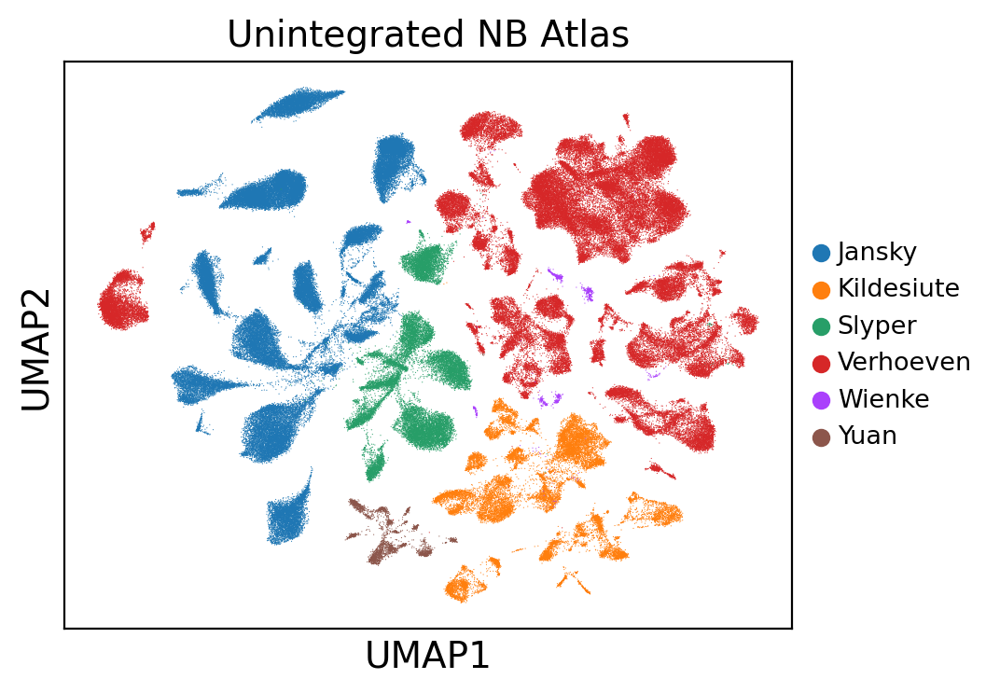

In [29]:
import os
os.chdir('/project/data/gew123/Integration/Benchmarking')
sc.settings.set_figure_params(dpi=100, facecolor='white', figsize=(5,4), dpi_save=400)

# Plot
sc.pl.umap(adata, color=batch_key, save='/Unintegrated_UMAP_NB_Final.png', title='Unintegrated NB Atlas', legend_fontsize='x-small')
#sc.pl.umap(adata, color=batch_key, save='/Unintegrated_UMAP_CTRL_Final.png')

In [ ]:
#### Inspect data to ensure it's suitable for a negative binomial model ####

# Assuming adata is your AnnData object and .X is the counts matrix
counts_matrix = adata.X

dense_matrix = counts_matrix.toarray()

# Check if there are any non-integer values
non_integers = np.mod(dense_matrix, 1) != 0
if np.any(non_integers):
    print("Data contains non-integer values.")

# Check for negative values
if np.any(dense_matrix < 0):
    print("Data contains negative values.")

# Ensure data is in integer format if no issues are found
if not np.any(non_integers) and not np.any(counts_matrix < 0):
    counts_matrix = counts_matrix.astype(int)

### (2) Select HVGs 

With multiple datasets, genes that are variable across the whole dataset could be capturing batch effects rather than the biological signals we are interested in; therefore genes needs to be selected in a batch - aware way (batch-aware highly variable gene selection) 


scanpy calculates HVGs for each batch separately and combines results by selecting genes highly variable in 
highest number of batches.

Three new adata.var columns:
1) highly_variable_nbatches - The number of batches where each gene was found to be highly variable
2) highly_variable_intersection - Whether each gene was highly variable in every batch
3) highly_variable - Whether each gene was selected as highly variable after combining the results from each batch

In [34]:
# Testing -- Select top 4000 highly variable genes
sc.pp.highly_variable_genes(
    adata, n_top_genes=4000, flavor="cell_ranger", batch_key=batch_key
)
adata

AnnData object with n_obs × n_vars = 183210 × 64612
    obs: 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Source_colors', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p', 'log_counts', 'norm_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [72]:
n_batches

0    49022
1    11020
2     2480
3      989
4      595
5      363
6      143
Name: highly_variable_nbatches, dtype: int64

0    49022
1    11020
2     2480
3      989
4      595
5      363
6      143
Name: highly_variable_nbatches, dtype: int64

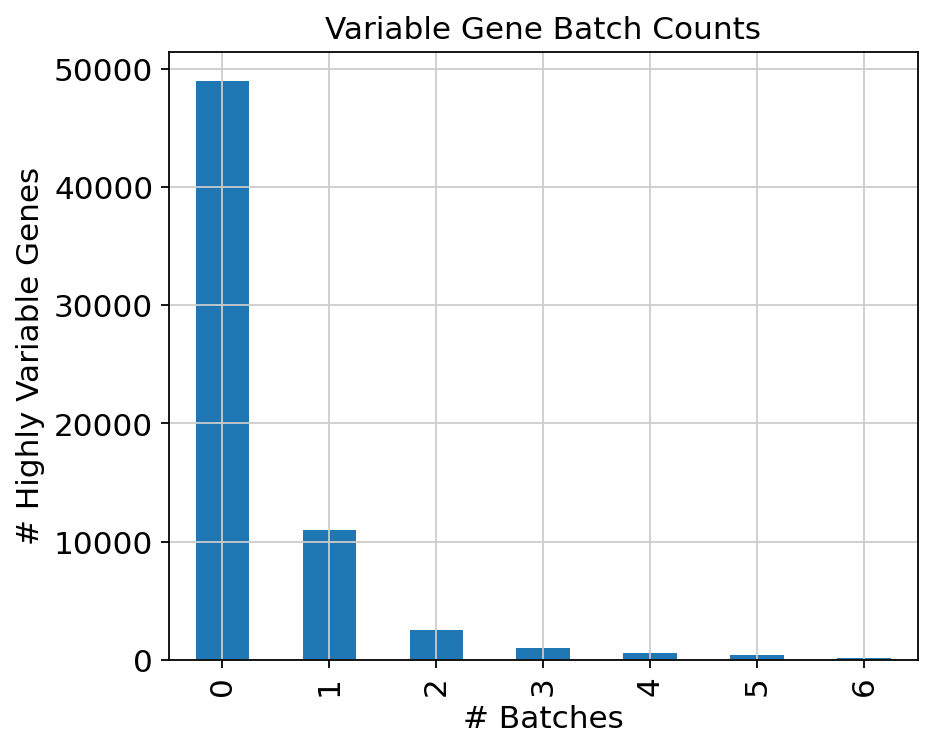

In [77]:
# Check how many batches each gene was variable in 
sc.settings.set_figure_params(dpi=80, facecolor='white', figsize=(6,5))



n_batches = adata.var["highly_variable_nbatches"].value_counts() # Get counts per gene (0-6)

red = 

n_batches.plot(kind='bar', title=f'Variable Gene Batch Counts', xlabel='# Batches',
                    ylabel='# Highly Variable Genes',) # Plot 
plt.savefig('/project/data/gew123/Integration/Benchmarking/var_gene_batch_counts_4000.png')

n_batches

In [133]:
import pandas as pd
import plotly.express as px
counts = list(n_batches)
counts.insert(2, 4000-sum(n_batches[3:len(counts)-1]))

# Sep data by variable cut off
data = {'Batch': [0, 1, 2, 2, 3, 4, 5, 6],
        'Count': list(counts),
'Variable': ['Not Variable', 'Not Variable', 'Variable', 'Not Variable', 'Variable', 'Variable', 'Variable', 'Variable']}

In [130]:
counts

[49022, 11020, 2053, 2480, 989, 595, 363, 143]

In [118]:
for i in data.values():
    print(len(i))

8
7
8


In [185]:

fig = px.bar(data, x="Batch", y="Count", color="Variable",
           #  title="Distribution of HVGs at 4000 Threshold",
             color_discrete_sequence=px.colors.qualitative.D3[0:2],
             width=800,
             height=600)

#fig.update_layout(
#     title={
#         'y':0.9,
#         'x':0.5,
#         'xanchor': 'center',
#         'yanchor': 'top'},
#     font=dict(family='DejaVu Sans', size=15, color='black'))

fig.write_image('/project/data/gew123/Integration/Benchmarking/HVG_400_Threshold_Barplot.png')

fig.show()

/tmp/ipykernel_777760/3935643028.py:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.


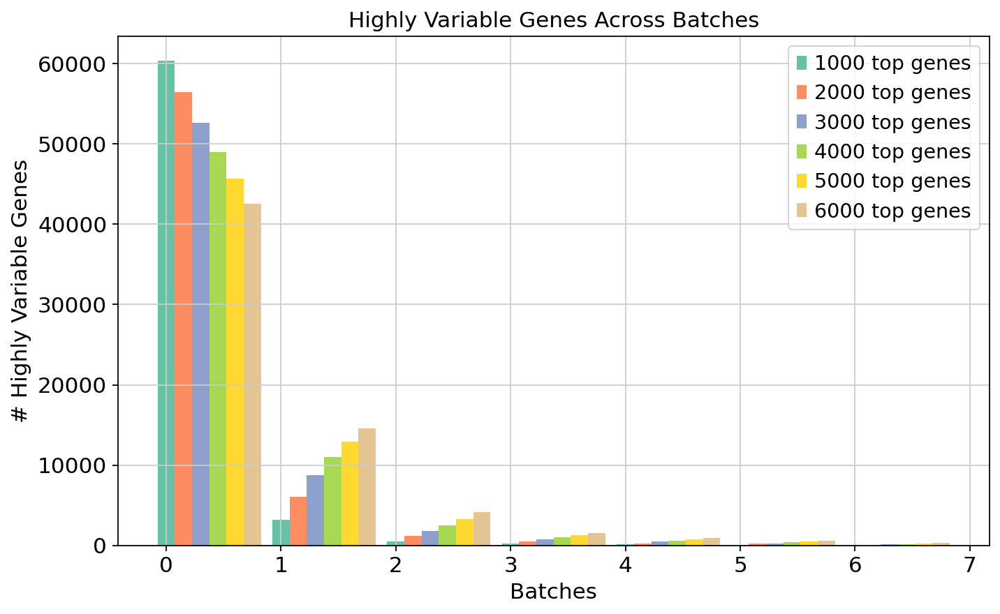

In [16]:
# See distribution across different n_top_genes levels

# Range of n_top_genes to test
n_top_genes = [1000, 2000, 3000, 4000, 5000, 6000]

# Dictionary to store results
results = {}

for i in n_top_genes:
    sc.pp.highly_variable_genes(adata, n_top_genes=i, flavor="cell_ranger", batch_key=batch_key)
    counts = adata.var['highly_variable_nbatches'].value_counts()
    results[i] = counts

# Convert results to a DataFrame
results_df = pd.DataFrame(results).fillna(0)

# Plot the results
fig, ax = plt.subplots(figsize=(10, 6))

# Index to offset bar groupings
indices = np.arange(len(results_df.index))
# Get width
bar_width = 0.15
cmap = get_cmap('Set2')

for set, i in enumerate(n_top_genes):
    color = cmap(set / len(n_top_genes))  # Get color
    ax.bar(indices + set * bar_width, results_df[i], bar_width, label=f'{i} top genes', color=color)


ax.set_xlabel('Batches')
ax.set_ylabel('# Highly Variable Genes')
ax.set_title('Highly Variable Genes Across Batches')
ax.legend()

# Save
plt.savefig('/project/data/gew123/Integration/Benchmarking/HVG_across_batches_barplot.png')
plt.show()



In [116]:
# Subset hvg for integration
adata_hvg = adata[:, adata.var["highly_variable"]].copy()

In [117]:
# Save adata with HVGs selected
adata_hvg.write(adata_hvg_out)

In [73]:
###### Stopping point where saved data can be read in if necessary #######
adata_hvg = sc.read_h5ad(hvg_dataset)
###### Stopping point where saved data can be read in if necessary #######

In [5]:
adata_hvg.obs

,Source,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier
AAACCTGAGCAATATG_1,Jansky,1165,7.061334,1706.0,7.442493,19.460727,0.0,0.000000,0.000000,39.0,3.688879,2.286049,0.0,0.000000,0.000000,False
AAACCTGAGCGCTTAT_1,Jansky,901,6.804615,1225.0,7.111512,17.142857,2.0,1.098612,0.163265,53.0,3.988984,4.326531,0.0,0.000000,0.000000,False
AAACCTGAGGCACATG_1,Jansky,1414,7.254885,2027.0,7.614805,13.616182,2.0,1.098612,0.098668,52.0,3.970292,2.565368,0.0,0.000000,0.000000,False
AAACCTGAGTGGCACA_1,Jansky,1051,6.958448,1392.0,7.239215,14.224138,2.0,1.098612,0.143678,50.0,3.931826,3.591954,0.0,0.000000,0.000000,False
AAACCTGAGTTCGCAT_1,Jansky,958,6.865891,1364.0,7.218910,18.035191,5.0,1.791759,0.366569,46.0,3.850148,3.372434,1.0,0.693147,0.073314,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
J15-39,Wienke,2091,7.645876,5550.4,8.621805,15.840300,357.0,5.880533,6.431969,591.3,6.384013,10.653286,0.0,0.000000,0.000000,False
N4-39,Wienke,1602,7.379632,3382.8,8.126755,14.213078,216.9,5.384036,6.411848,382.1,5.948296,11.295377,0.0,0.000000,0.000000,False
N18-39,Wienke,2194,7.693937,4917.2,8.500698,11.392662,178.3,5.189060,3.626047,417.0,6.035481,8.480436,1.0,0.693147,0.020337,False
O14-39,Wienke,2260,7.723562,5545.8,8.620976,14.544340,333.3,5.812039,6.009953,474.2,6.163736,8.550615,0.0,0.000000,0.000000,False


In [74]:
adata_hvg

AnnData object with n_obs × n_vars = 183210 × 4000
    obs: 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Source_colors', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p', 'log_counts', 'norm_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [71]:
# Read in raw counts matrix
raw = sc.read_h5ad('/project/data/gew123/Integration/Processed_Raw_Counts.h5ad')

In [75]:
# Update raw counts to adata.layers['raw_counts']
adata.layers['raw_counts'] = raw.layers['raw_counts']

ValueError: Value passed for key 'raw_counts' is of incorrect shape. Values of layers must match dimensions (0, 1) of parent. Value had shape (183210, 64612) while it should have had (183210, 4000).

In [66]:
# Updating merged object now with the stored raw_counts matrix
adata.write(merged_dataset)

## Run integration at different epochs

In [76]:
# Make copy of data
adata_scvi = adata_hvg.copy()

In [77]:
adata_scvi

AnnData object with n_obs × n_vars = 183210 × 4000
    obs: 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Source_colors', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p', 'log_counts', 'norm_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [78]:
# Set raw counts to .X
adata_scvi.X = adata_scvi.layers['raw_counts']

In [79]:
# Setup model
scvi.model.SCVI.setup_anndata(adata_scvi, layer = 'raw_counts', batch_key='Source')

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[raw_counts] does not contain unnormalized count data. Are you sure this is what you want?


In [80]:
# View setup
adata_scvi

AnnData object with n_obs × n_vars = 183210 × 4000
    obs: 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', '_scvi_batch', '_scvi_labels'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Source_colors', 'hvg', 'neighbors', 'pca', 'umap', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p', 'log_counts', 'norm_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [85]:
# Function for plotting model history
def plot_model_history(model, epochs):
    history_df = (
        model.history['elbo_train'].astype(float)
        .join(model.history['elbo_validation'].astype(float))
        .reset_index()
        .melt(id_vars = ['epoch'])
    )

    p.options.figure_size = 6, 3
    
    # Filter epochs
    history_df = history_df[history_df['epoch'] % 2 == 0]


    p_ = (
        p.ggplot(p.aes(x = 'epoch', y = 'value', color = 'variable'), history_df.query('epoch > 0'))
        + p.geom_line()
        + p.geom_point()
        + p.scale_color_manual({'elbo_train': 'black', 'elbo_validation': 'red'})
        + p.theme_minimal()
    )
    p_.save(f'scvi_{epochs}epochs_histplot.png', dpi = 300)

    print(p_)

INTEGRATING WITH 50 EPOCHS
Training model at 50 epochs...


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/50:   0%|                                        | 0/50 [00:00<?, ?it/s]

<frozen abc>:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 2/50:   2%| | 1/50 [00:39<32:33, 39.86s/it, v_num=1, train_loss_step=843, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 3/50:   4%| | 2/50 [01:19<31:50, 39.80s/it, v_num=1, train_loss_step=473, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 4/50:   6%| | 3/50 [01:58<30:57, 39.53s/it, v_num=1, train_loss_step=581, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 5/50:   8%| | 4/50 [02:39<30:47, 40.17s/it, v_num=1, train_loss_step=566, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 6/50:  10%| | 5/50 [03:20<30:06, 40.15s/it, v_num=1, train_loss_step=526, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 7/50:  12%| | 6/50 [03:59<29:19, 40.00s/it, v_num=1, train_loss_step=589, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 8/50:  14%|▏| 7/50 [04:39<28:32, 39.82s/it, v_num=1, train_loss_step=477, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 9/50:  16%|▏| 8/50 [05:18<27:47, 39.71s/it, v_num=1, train_loss_step=551, 

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 10/50:  18%|▏| 9/50 [05:55<26:34, 38.89s/it, v_num=1, train_loss_step=561,

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 11/50:  20%|▏| 10/50 [06:37<26:29, 39.73s/it, v_num=1, train_loss_step=506

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 12/50:  22%|▏| 11/50 [07:16<25:45, 39.63s/it, v_num=1, train_loss_step=614

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 13/50:  24%|▏| 12/50 [07:55<24:49, 39.20s/it, v_num=1, train_loss_step=464

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 14/50:  26%|▎| 13/50 [08:35<24:19, 39.45s/it, v_num=1, train_loss_step=569

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 15/50:  28%|▎| 14/50 [09:13<23:30, 39.18s/it, v_num=1, train_loss_step=647

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 16/50:  30%|▎| 15/50 [09:52<22:49, 39.13s/it, v_num=1, train_loss_step=614

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 17/50:  32%|▎| 16/50 [10:29<21:48, 38.50s/it, v_num=1, train_loss_step=515

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 18/50:  34%|▎| 17/50 [11:06<20:58, 38.12s/it, v_num=1, train_loss_step=543

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 19/50:  36%|▎| 18/50 [11:44<20:13, 37.93s/it, v_num=1, train_loss_step=538

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 20/50:  38%|▍| 19/50 [12:24<19:56, 38.61s/it, v_num=1, train_loss_step=604

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 21/50:  40%|▍| 20/50 [13:01<19:04, 38.16s/it, v_num=1, train_loss_step=627

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 22/50:  42%|▍| 21/50 [13:40<18:30, 38.31s/it, v_num=1, train_loss_step=733

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 23/50:  44%|▍| 22/50 [14:18<17:50, 38.24s/it, v_num=1, train_loss_step=514

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 24/50:  46%|▍| 23/50 [14:56<17:11, 38.22s/it, v_num=1, train_loss_step=582

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 25/50:  48%|▍| 24/50 [15:36<16:44, 38.64s/it, v_num=1, train_loss_step=537

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 26/50:  50%|▌| 25/50 [16:13<15:58, 38.35s/it, v_num=1, train_loss_step=481

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 27/50:  52%|▌| 26/50 [16:50<15:08, 37.85s/it, v_num=1, train_loss_step=474

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 28/50:  54%|▌| 27/50 [17:29<14:35, 38.08s/it, v_num=1, train_loss_step=547

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 29/50:  56%|▌| 28/50 [18:07<13:58, 38.09s/it, v_num=1, train_loss_step=574

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 30/50:  58%|▌| 29/50 [18:45<13:20, 38.12s/it, v_num=1, train_loss_step=505

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 31/50:  60%|▌| 30/50 [19:23<12:39, 37.98s/it, v_num=1, train_loss_step=555

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 32/50:  62%|▌| 31/50 [19:59<11:52, 37.49s/it, v_num=1, train_loss_step=544

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 33/50:  64%|▋| 32/50 [20:36<11:12, 37.39s/it, v_num=1, train_loss_step=560

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 34/50:  66%|▋| 33/50 [21:17<10:54, 38.51s/it, v_num=1, train_loss_step=627

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 35/50:  68%|▋| 34/50 [21:57<10:21, 38.85s/it, v_num=1, train_loss_step=602

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 36/50:  70%|▋| 35/50 [22:35<09:37, 38.51s/it, v_num=1, train_loss_step=622

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 37/50:  72%|▋| 36/50 [23:13<09:00, 38.60s/it, v_num=1, train_loss_step=616

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 38/50:  74%|▋| 37/50 [23:51<08:17, 38.28s/it, v_num=1, train_loss_step=603

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 39/50:  76%|▊| 38/50 [24:29<07:39, 38.29s/it, v_num=1, train_loss_step=519

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 40/50:  78%|▊| 39/50 [25:09<07:06, 38.75s/it, v_num=1, train_loss_step=589

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 41/50:  80%|▊| 40/50 [25:47<06:26, 38.61s/it, v_num=1, train_loss_step=587

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 42/50:  82%|▊| 41/50 [26:28<05:52, 39.20s/it, v_num=1, train_loss_step=530

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 43/50:  84%|▊| 42/50 [27:06<05:10, 38.84s/it, v_num=1, train_loss_step=591

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 44/50:  86%|▊| 43/50 [27:46<04:34, 39.27s/it, v_num=1, train_loss_step=628

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 45/50:  88%|▉| 44/50 [28:25<03:54, 39.10s/it, v_num=1, train_loss_step=638

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 46/50:  90%|▉| 45/50 [29:05<03:16, 39.38s/it, v_num=1, train_loss_step=551

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 47/50:  92%|▉| 46/50 [29:42<02:34, 38.71s/it, v_num=1, train_loss_step=529

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 48/50:  94%|▉| 47/50 [30:18<01:53, 37.84s/it, v_num=1, train_loss_step=563

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 49/50:  96%|▉| 48/50 [30:54<01:14, 37.22s/it, v_num=1, train_loss_step=490

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 50/50:  98%|▉| 49/50 [31:33<00:37, 37.88s/it, v_num=1, train_loss_step=687

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scvi/module/_vae.py:477: UserWarning: The value argument must be within the support of the distribution


Epoch 50/50: 100%|█| 50/50 [32:11<00:00, 37.84s/it, v_num=1, train_loss_step=631

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|█| 50/50 [32:11<00:00, 38.63s/it, v_num=1, train_loss_step=631
Plotting model history:


/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 6 x 3 in image.
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: scvi_50epochs_histplot.png


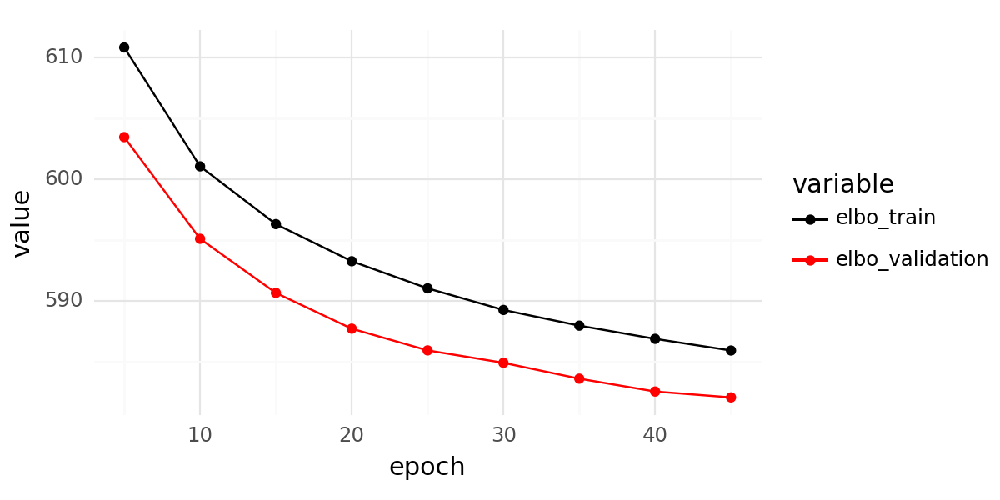

PermissionError: [Errno 13] Permission denied: '/scvi_model_50_epochs'

In [82]:
# RUN INTEGRATION

sc.settings.figdir = '/project/data/gew123/Integration/Benchmarking'

# Function to train the model
def train_model(epochs):
    model = scvi.model.SCVI(adata_scvi)
    
    print(f'Training model at {epochs} epochs...')
    model.train(max_epochs=epochs, check_val_every_n_epoch = round(epochs/20) , early_stopping=True)
    adata_scvi.obsm["X_scVI"] = model.get_latent_representation()

    print(f'Plotting model history:')
    # Plot model history
    plot_model_history(model, epochs)
    
    # Cluster and embed
#     print('Model trained, generating neighborhood graph.')
#     sc.pp.neighbors(adata_scvi, use_rep="X_scVI")
#     print('Integrated UMAP:')
#     sc.tl.umap(adata_scvi)
    
    # Save
#     print(f'Saving {epochs} epoch adata')
#     adata_scvi.write(f'/project/data/gew123/Integration/Benchmarking/scvi_{epochs}_epochs.h5ad')
    
#     # Plot
#     sc.pl.umap(adata_scvi, color=batch_key, save=f'/Integrated_NB_{epochs}_epoch_UMAP.png')

    # sc.tl.leiden(adata)
    # sc.pl.umap(adata, color=["source"], save=f'scvi_{epochs}epoch_clustered.png') # don't want to cluster yet
    
    # Optionally, save the model and results
    model.save(f"/scvi_model_{epochs}_epochs")


# Train and evaluate at epochs of 20, 50 and 100
for epoch in [50]:
    print(f'INTEGRATING WITH {epoch} EPOCHS')
    train_model(epoch)

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


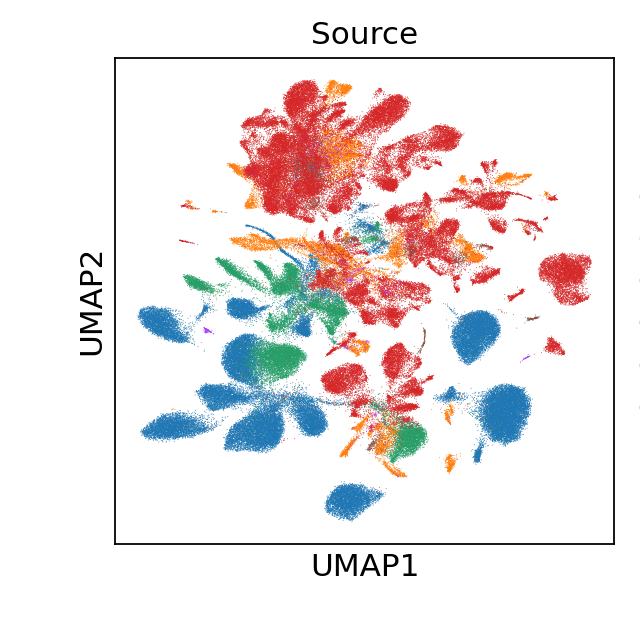

In [38]:
# Error in plotting - plotted separately
sc.pl.umap(adata_20, color=batch_key, save='/Integrated_NB_20_epoch_UMAP.png')

In [ ]:
# Replot at new fig sizes
adata_20 = sc.read_h5ad('/project/data/gew123/Integration/Benchmarking/scvi_20_epochs.h5ad')
adata_50 = sc.read_h5ad('/project/data/gew123/Integration/Benchmarking/scvi_50_epochs.h5ad')
adata_100 = sc.read_h5ad('/project/data/gew123/Integration/Benchmarking/scvi_100_epochs.h5ad')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


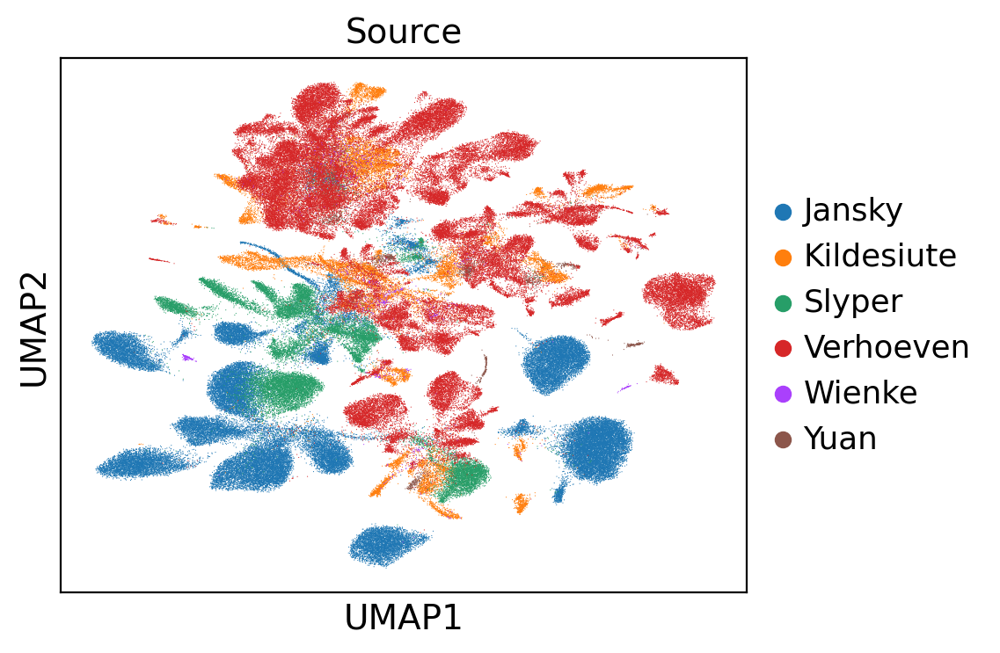

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


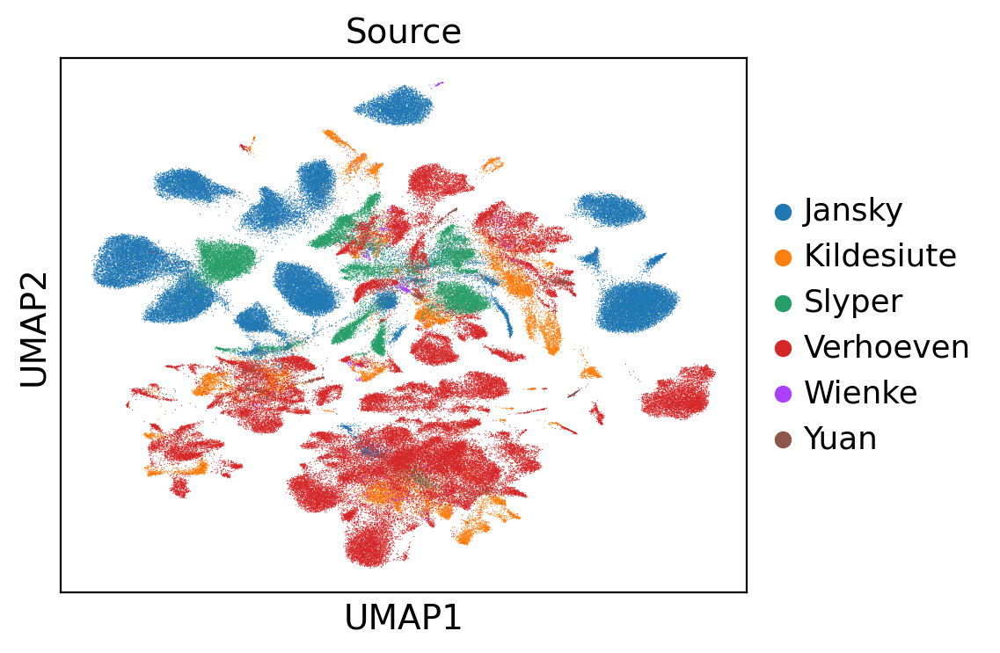

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


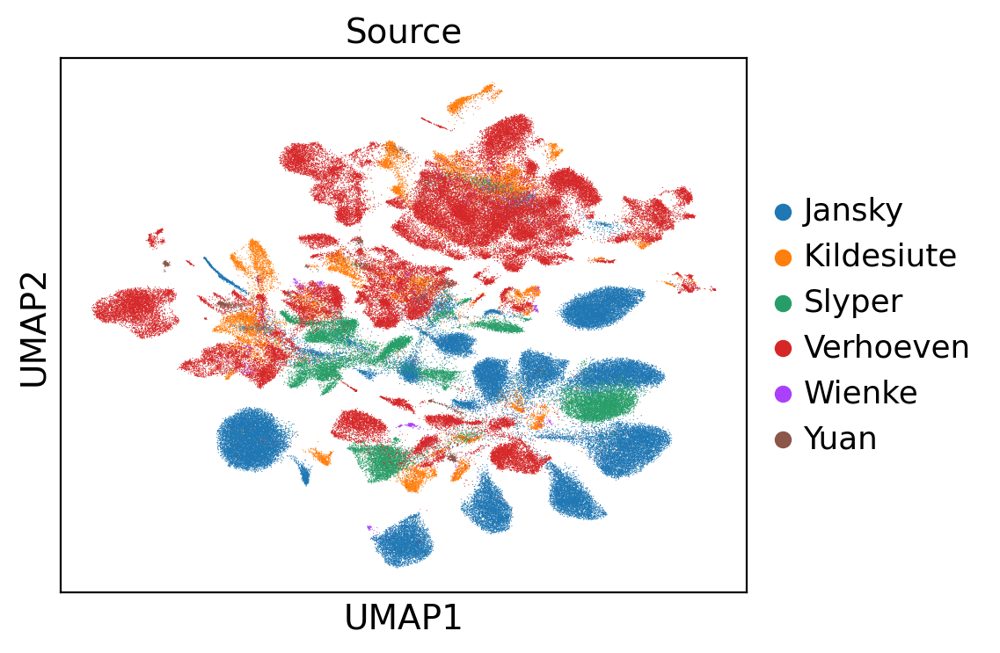

In [21]:
sc.settings.set_figure_params(dpi=100, facecolor='white', figsize=(5,4))

sc.pl.umap(adata_20, color=batch_key, save='/Integrated_NB_20_epoch_UMAP.png')
sc.pl.umap(adata_50, color=batch_key, save='/Integrated_NB_50_epoch_UMAP.png')
sc.pl.umap(adata_100, color=batch_key, save='/Integrated_NB_100_epoch_UMAP.png')

### Move forward with clustering on best integrated dataset

In [30]:
adata_100 = sc.read_h5ad('/project/data/gew123/Integration/Benchmarking/scvi_100_epochs.h5ad')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


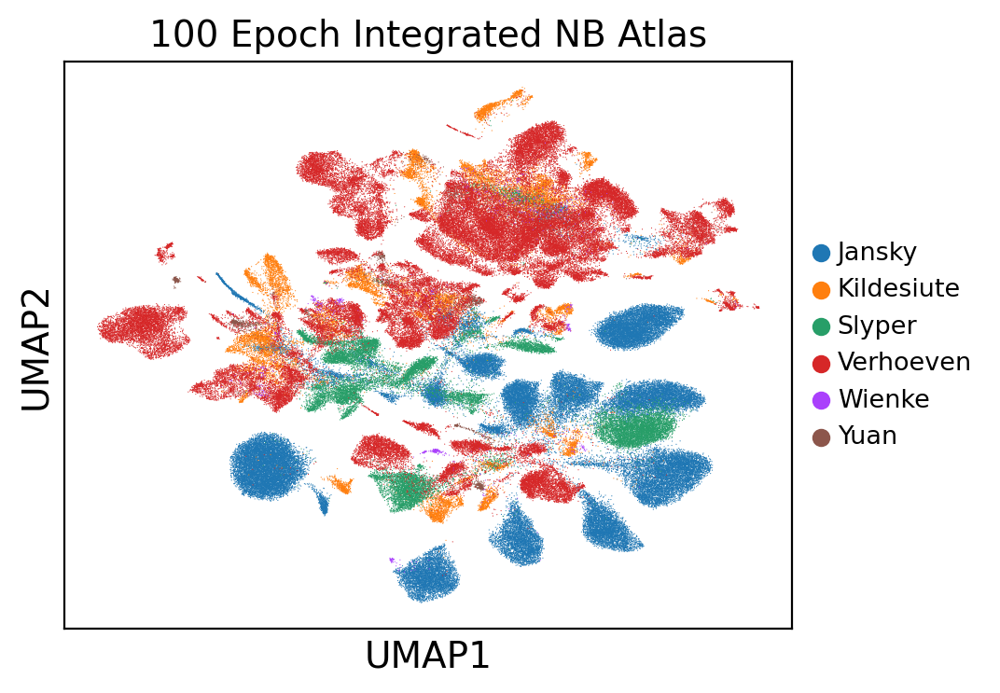

In [31]:
sc.set_figure_params(scanpy=True, dpi=100, figsize=(5,4), dpi_save=400)
sc.pl.umap(adata_100, color=batch_key, save='/Integrated_NB_100_epoch_UMAP.png', title='100 Epoch Integrated NB Atlas', legend_fontsize='x-small')

In [10]:
sc.set_figure_params(scanpy=True, dpi=80, figsize=(6,5), dpi_save=400)
sc.settings.figdir = '/project/data/gew123/Cell_Annotation/Figures'

In [16]:
# Cluster on 100 epoch dataset
adata = adata_100

In [7]:
adata

AnnData object with n_obs × n_vars = 183210 × 4000
    obs: 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', '_scvi_batch', '_scvi_labels'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Source_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'log1p', 'log_counts', 'norm_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [6]:
batch_key = 'Source'

In [7]:
# Set normalized data
adata.X = adata.layers['log_counts']

In [8]:
##### Testing at a single resolution #####
# (1) call the cluster algorithm on the X_scvi data
sc.tl.leiden(adata, resolution=0.9, key_added='leiden_res0.9')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


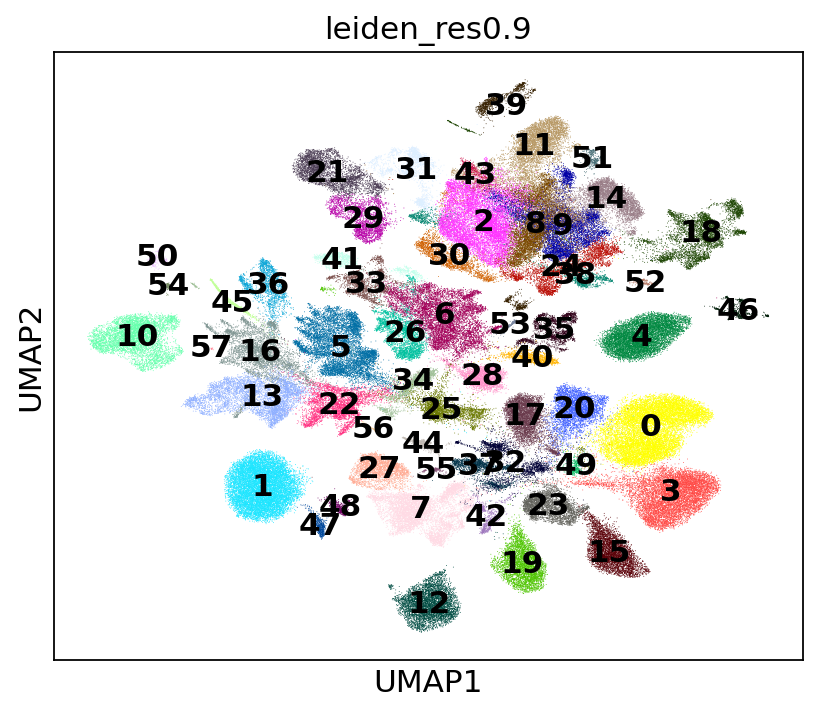

In [11]:
# (2) Then plot with the new embeddings
sc.pl.umap(adata, color=["leiden_res0.9"], legend_loc="on data")

In [12]:
adata.obs

,Source,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,outlier,_scvi_batch,_scvi_labels,leiden_res0.7,leiden_res0.9
AAACCTGAGCAATATG_1,Jansky,1165,7.061334,1706.0,7.442493,19.460727,0.0,0.000000,0.000000,39.0,3.688879,2.286049,0.0,0.000000,0.000000,False,0,0,16,15
AAACCTGAGCGCTTAT_1,Jansky,901,6.804615,1225.0,7.111512,17.142857,2.0,1.098612,0.163265,53.0,3.988984,4.326531,0.0,0.000000,0.000000,False,0,0,16,15
AAACCTGAGGCACATG_1,Jansky,1414,7.254885,2027.0,7.614805,13.616182,2.0,1.098612,0.098668,52.0,3.970292,2.565368,0.0,0.000000,0.000000,False,0,0,16,15
AAACCTGAGTGGCACA_1,Jansky,1051,6.958448,1392.0,7.239215,14.224138,2.0,1.098612,0.143678,50.0,3.931826,3.591954,0.0,0.000000,0.000000,False,0,0,16,15
AAACCTGAGTTCGCAT_1,Jansky,958,6.865891,1364.0,7.218910,18.035191,5.0,1.791759,0.366569,46.0,3.850148,3.372434,1.0,0.693147,0.073314,False,0,0,16,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
J15-39,Wienke,2091,7.645876,5550.4,8.621805,15.840300,357.0,5.880533,6.431969,591.3,6.384013,10.653286,0.0,0.000000,0.000000,False,4,0,11,2
N4-39,Wienke,1602,7.379632,3382.8,8.126755,14.213078,216.9,5.384036,6.411848,382.1,5.948296,11.295377,0.0,0.000000,0.000000,False,4,0,9,8
N18-39,Wienke,2194,7.693937,4917.2,8.500698,11.392662,178.3,5.189060,3.626047,417.0,6.035481,8.480436,1.0,0.693147,0.020337,False,4,0,11,11
O14-39,Wienke,2260,7.723562,5545.8,8.620976,14.544340,333.3,5.812039,6.009953,474.2,6.163736,8.550615,0.0,0.000000,0.000000,False,4,0,11,11


In [13]:
# Save res 0.9 .obs column
adata.write('/project/data/gew123/Integration/Scvi_Clustered_Object_Final.h5ad')

In [24]:
# adata object already has umap embeddings that were generated after integration

##### Testing 10 different resolutions #####

# Try on clustering for all leiden resolutions
resolutions = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
clusterings = {}

for i in resolutions:
    print('Clustering at resolution:', i, '.....')
    sc.tl.leiden(adata, key_added=f'leiden_res{i}', resolution=i)
    clusterings[i] = adata.obs[f'leiden_res{i}'].copy()
    print('Done')

# Convert to list
labels = []
for i in clusterings.keys():
    labels.append(f'leiden_res{i}')

Clustering at resolution: 0.1 .....
Done
Clustering at resolution: 0.2 .....
Done
Clustering at resolution: 0.3 .....
Done
Clustering at resolution: 0.4 .....
Done
Clustering at resolution: 0.5 .....
Done
Clustering at resolution: 0.6 .....
Done
Clustering at resolution: 0.7 .....
Done
Clustering at resolution: 0.8 .....
Done
Clustering at resolution: 0.9 .....
Done
Clustering at resolution: 1.0 .....
Done
Calculating ASW scores for each resolution...
Calculating ASW for leiden_res0.1


KeyError: 'X_scvi'

In [26]:
adata

AnnData object with n_obs × n_vars = 183210 × 4000
    obs: 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', '_scvi_batch', '_scvi_labels', 'leiden_res0.7', 'leiden_res0.1', 'leiden_res0.2', 'leiden_res0.3', 'leiden_res0.4', 'leiden_res0.5', 'leiden_res0.6', 'leiden_res0.8', 'leiden_res0.9', 'leiden_res1.0'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Source_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'neighbors', 'pca', 'umap', 'leiden', 'leiden_res0.7_colors'
    obsm: 'X_

In [27]:
##### Generate ASW scores #####
print(f'Calculating ASW scores for each resolution...')

scores = {}

for i in labels:
    print(f'Calculating ASW for {i}')
    assignments = adata.obs[i]
    # Calculate score based on X_scvi representation
    asw_score = silhouette_score(adata.obsm['X_scVI'], assignments)
    scores[i] = asw_score
    print(asw_score)

print(scores)

Calculating ASW scores for each resolution...
Calculating ASW for leiden_res0.1
0.17370945
Calculating ASW for leiden_res0.2
0.19978124
Calculating ASW for leiden_res0.3
0.20817868
Calculating ASW for leiden_res0.4
0.21101885
Calculating ASW for leiden_res0.5
0.22507945
Calculating ASW for leiden_res0.6
0.22321638
Calculating ASW for leiden_res0.7
0.23360595
Calculating ASW for leiden_res0.8
0.23218799
Calculating ASW for leiden_res0.9
0.23482123
Calculating ASW for leiden_res1.0
0.23138584
{'leiden_res0.1': 0.17370945, 'leiden_res0.2': 0.19978124, 'leiden_res0.3': 0.20817868, 'leiden_res0.4': 0.21101885, 'leiden_res0.5': 0.22507945, 'leiden_res0.6': 0.22321638, 'leiden_res0.7': 0.23360595, 'leiden_res0.8': 0.23218799, 'leiden_res0.9': 0.23482123, 'leiden_res1.0': 0.23138584}


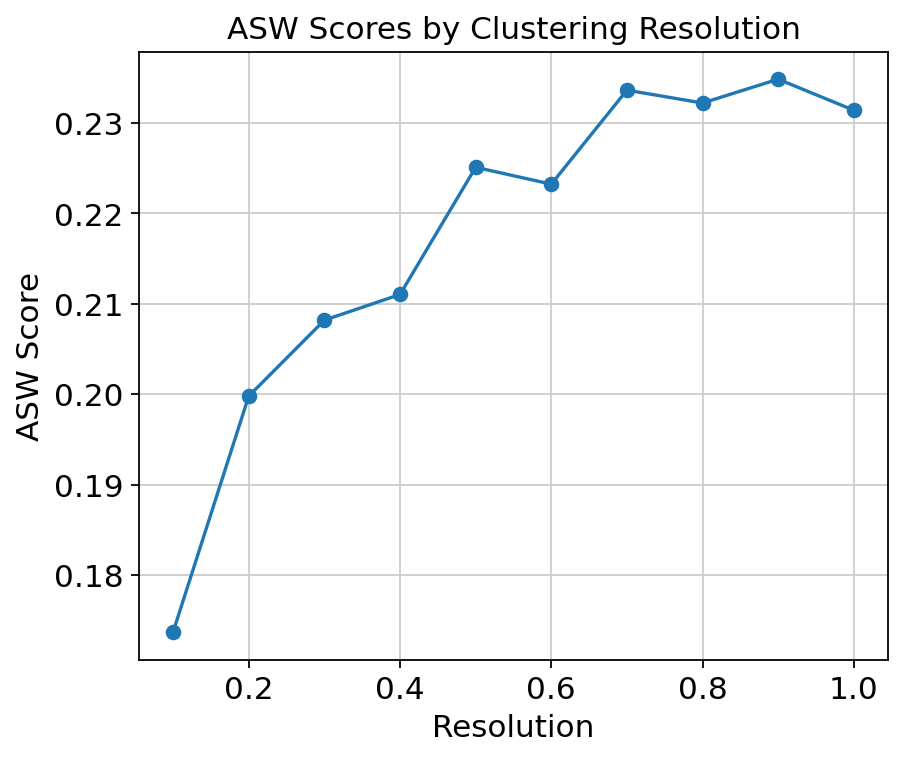

In [28]:
# Plot ASW scores
plt.plot(resolutions, scores.values(), marker='o')
plt.title("ASW Scores by Clustering Resolution")
plt.xlabel("Resolution")
plt.ylabel("ASW Score")
plt.savefig('/project/data/gew123/Cell_Annotation/Figures/ASW_plot.png')
plt.show()

In [32]:
resolutions

for index, i in enumerate(resolutions):
    resolutions[index] = f'leiden_res{i}'

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages

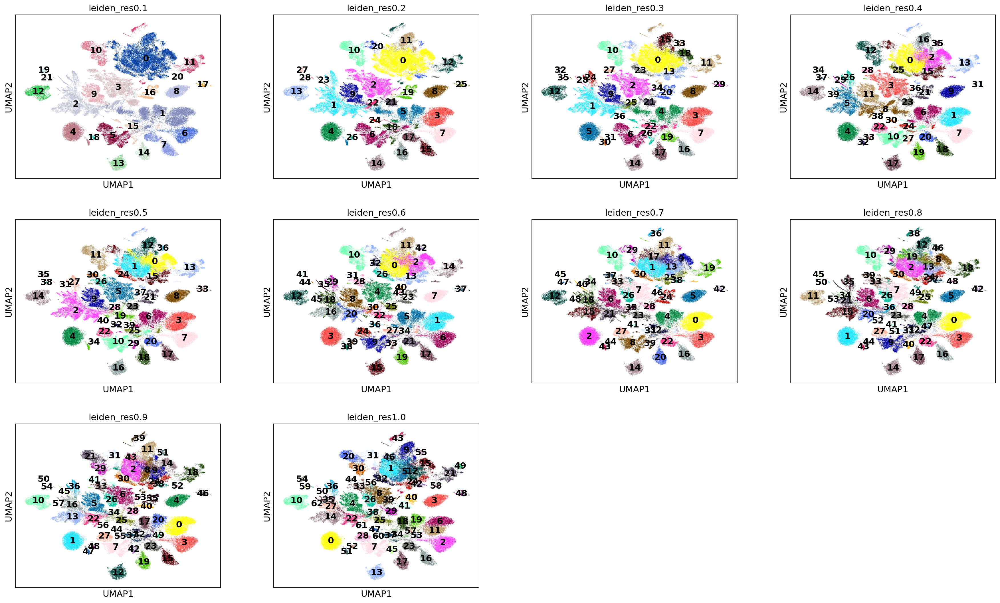

In [33]:
# Plot UMAPs at each resolution
sc.pl.umap(adata, color=resolutions, legend_loc="on data")

In [44]:
max_asw = max(scores.values())

best_res = list(scores.keys())[list(scores.values()).index(max_asw)]

In [58]:
resolutions

['leiden_res0.1',
 'leiden_res0.2',
 'leiden_res0.3',
 'leiden_res0.4',
 'leiden_res0.5',
 'leiden_res0.6',
 'leiden_res0.7',
 'leiden_res0.8',
 'leiden_res0.9',
 'leiden_res1.0']

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


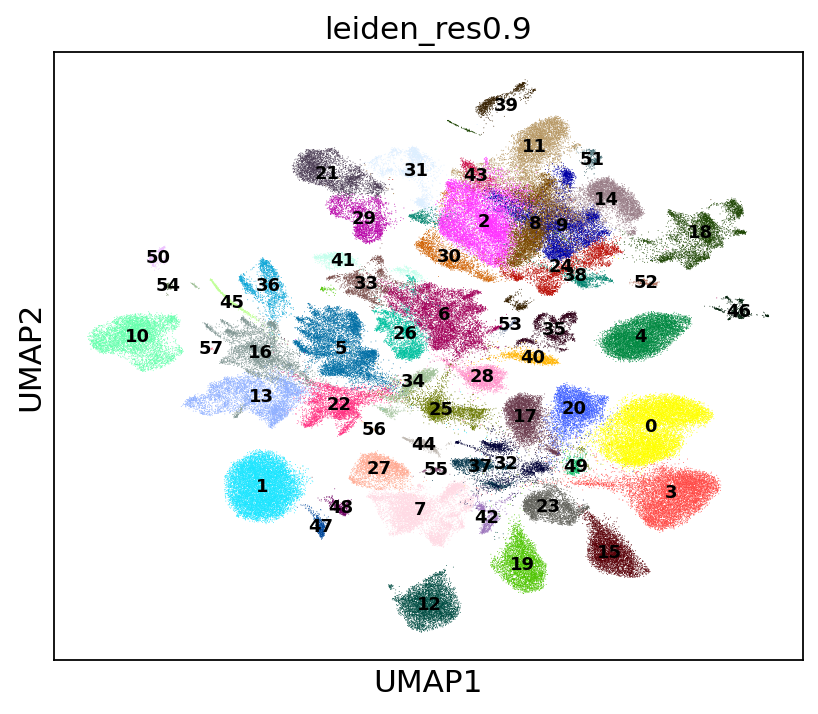

In [54]:
# Plot best UMAP
sc.pl.umap(adata, color=best_res, legend_loc="on data",  legend_fontsize='xx-small',
           save='scVI_Clustered_UMAP_Final_res09.png')

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


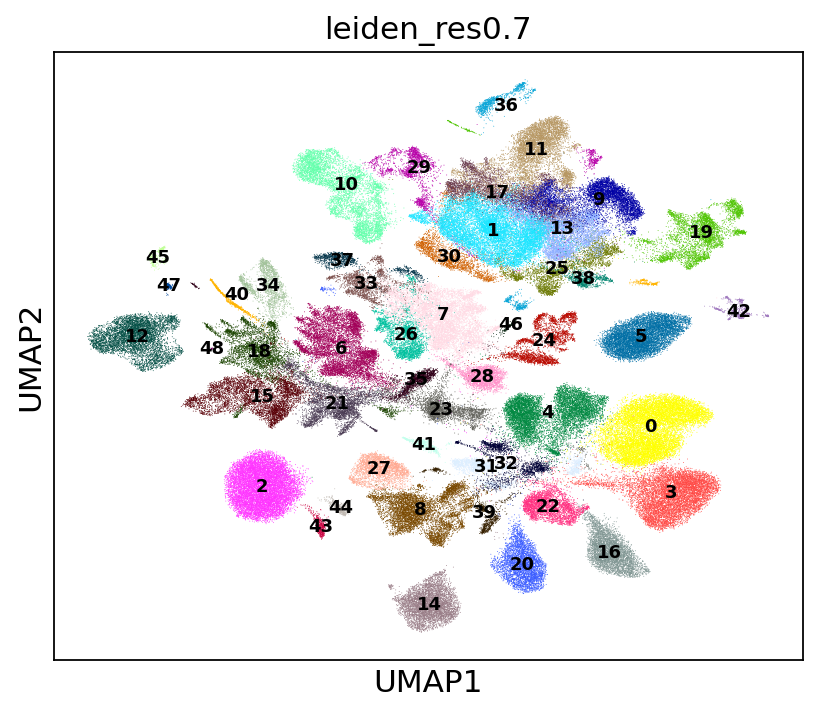

In [10]:
# Also plot resolution 0.7
sc.pl.umap(adata, color='leiden_res0.7', legend_loc="on data",  legend_fontsize='xx-small')
       #    ,save='scVI_Clustered_UMAP_Final_res07.png')

## Saving the final clustered object

In [14]:
# Save!!!!! at 0.7 resolution
adata.write('/project/data/gew123/Integration/Scvi_Clustered_Object_Final.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 183210 × 4000
    obs: 'Source', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', '_scvi_batch', '_scvi_labels', 'leiden_res0.7'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'Source_colors', '_scvi_manager_uuid', '_scvi_uuid', 'hvg', 'leiden', 'leiden_res0.7_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'log1p', 'log_counts', 'norm_counts', 'raw_counts'
    obsp: 'connectivities', 'distances'

In [3]:
adata = sc.read_h5ad('/project/data/gew123/Integration/Scvi_Clustered_Object_Final.h5ad')

In [16]:
palette = sns.color_palette('husl', 57)

/project/soft/linux64/anaconda/Anaconda3-2023.09-0-Linux-x86_64/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


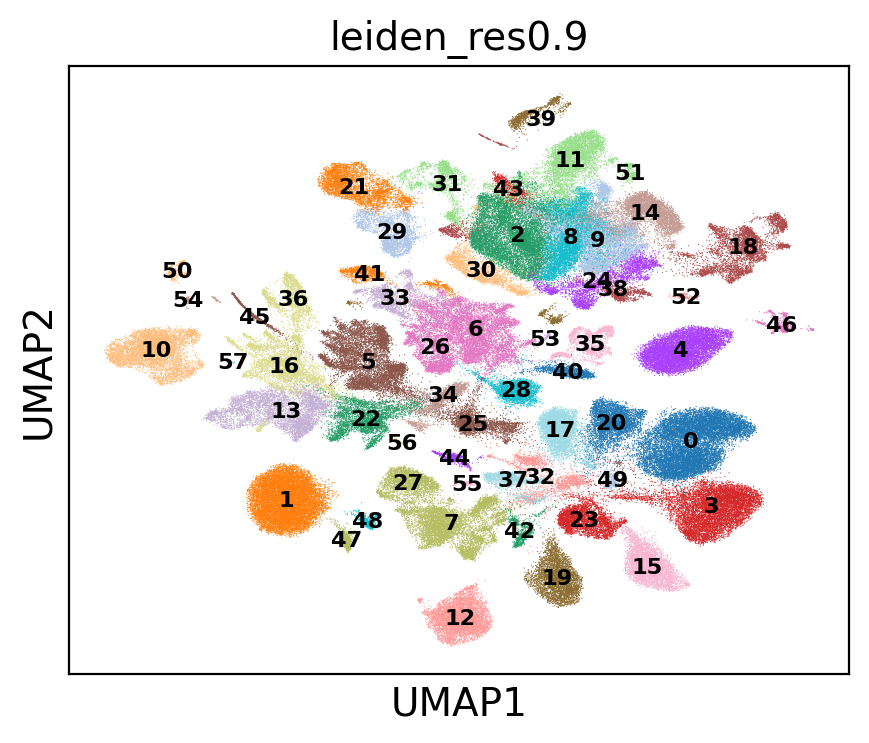

In [19]:
sc.set_figure_params(scanpy=True, dpi=100, figsize=(5,4), dpi_save=400)
sc.settings.figdir = '/project/data/gew123/Cell_Annotation/Figures'
sc.pl.umap(adata, color='leiden_res0.9', legend_loc="on data",  legend_fontsize='xx-small', palette=plt.rcParams["axes.prop_cycle"])
